# NMF with better baselines 

*This notebook is an adapted version of notebook '04_XRD-with-NMF-trial.ipynb', now hopefully with better baseline information.*

%pip install h5py

%pip install xraydb

%pip install pybaselines

In [38]:
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import h5py
import scipy.signal as ssg
import skimage.exposure as ske
import os
import re
import matplotlib.cm as cm 
import maxrf4u as mx
import pickle
from matplotlib.patches import Rectangle 
import sklearn.decomposition as skd 
from IPython.display import SVG 
import xraydb
from scipy.constants import c as light_speed
from scipy.constants import e as electron_charge
from scipy.constants import Planck 

from pybaselines.morphological import rolling_ball 

In [2]:
os.chdir('../..')

In [3]:
#!tree

## Our favorite sample `IvdW_1038646_1`

Our colleagues in Grenoble scanned three paint samples. 

In [4]:
h5_files = glob('../**/*.h5', recursive=True)
for i, fn in enumerate(h5_files): 
    print(f'[{i}] {fn}')

[0] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/raw/XRD/IvdW_0333329_01/IvdW_0333329_01_roi91399_107460/IvdW_0333329_01_roi91399_107460.h5
[1] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/raw/XRD/IvdW_1038646_1/IvdW_1038646_1_roi91400_107461/IvdW_1038646_1_roi91400_107461.h5
[2] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/raw/XRD/IvdW_90_12_X5/IvdW_90_12_X5_roi91398_107459/IvdW_90_12_X5_roi91398_107459.h5
[3] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/XRD/IvdW_0333329_01/IvdW_0333329_01_roi91399_107460/IvdW_0333329_01_roi91399_107460.h5
[4] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/XRD/IvdW_1038646_1/IvdW_1038646_1_roi91400_107461/IvdW_1038646_1_roi91400_107461.h5
[5] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/XRD/IvdW_90_12_X5/IvdW_90_12_X5_roi91398_107459/IvdW_90_12_X5_roi91398_107459.h5


In [5]:
favorite = 'IvdW_1038646_1'

In [6]:
fh = h5py.File(h5_files[1], mode='r') 

In [7]:
list_of_names = []
fh.visit(list_of_names.append)
list_of_names

['1.1',
 '1.1/eiger_average',
 '1.1/eiger_average/average',
 '1.1/eiger_average/average/2th',
 '1.1/eiger_average/average/average_intensity',
 '1.1/eiger_average/average/reference_hydrocerussite',
 '1.1/eiger_diffmap',
 '1.1/eiger_diffmap/configuration',
 '1.1/eiger_diffmap/configuration/data',
 '1.1/eiger_diffmap/configuration/type',
 '1.1/eiger_diffmap/dim0',
 '1.1/eiger_diffmap/dim1',
 '1.1/eiger_diffmap/dim2',
 '1.1/eiger_diffmap/mask_file',
 '1.1/eiger_diffmap/offset',
 '1.1/eiger_diffmap/program',
 '1.1/eiger_diffmap/result',
 '1.1/eiger_diffmap/result/2th',
 '1.1/eiger_diffmap/result/intensity',
 '1.1/eiger_diffmap/result/map',
 '1.1/eiger_integrate',
 '1.1/eiger_integrate/configuration',
 '1.1/eiger_integrate/configuration/data',
 '1.1/eiger_integrate/configuration/type',
 '1.1/eiger_integrate/integrated',
 '1.1/eiger_integrate/integrated/2th',
 '1.1/eiger_integrate/integrated/intensity',
 '1.1/eiger_integrate/integrated/points',
 '1.1/eiger_integrate/program',
 '1.1/eiger_inte

In [8]:
intensity = np.array(fh['1.1/eiger_diffmap/result/intensity']) 
x = np.array(fh['1.1/eiger_integrate/integrated/2th'])

intensity = intensity.transpose([1, 0, 2]) #rotate 90 degrees to match microscopy images
intensity.shape

(310, 160, 1400)

In [9]:
x.min(), x.max()

(0.33699664947841473, 55.42159941911291)

Let's take a look at the sum map of our favorite sample. 

In [10]:
sum_map = np.sum(intensity, axis=2)
sum_map.shape

(310, 160)

In [11]:
%matplotlib widget

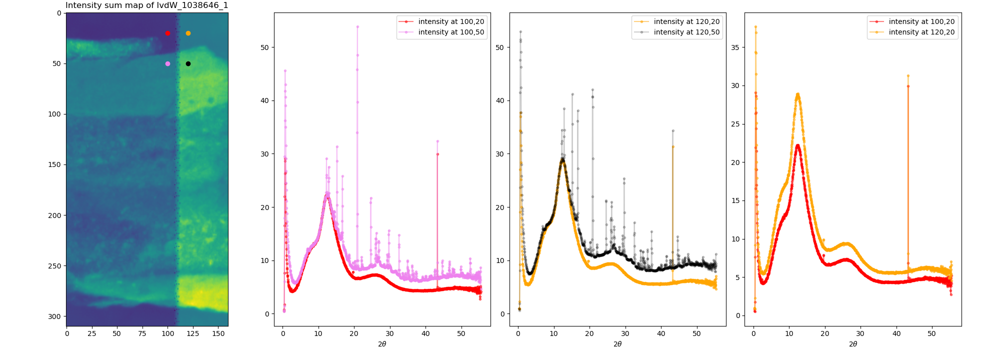

In [12]:
i1, i2 = 20, 50 
j1, j2 = 100, 120

fig, axs = plt.subplots(ncols=4, figsize=[20, 7], layout='compressed')
ax0, ax1, ax2, ax3 = axs.flatten()

ax1.sharey(ax2)
ax1.sharex(ax2)

ax0.imshow(sum_map)
ax0.set_title(f'Intensity sum map of {favorite}')
ax0.scatter(j1, i1, color='r')
ax0.scatter(j2, i1, color='orange')
ax0.scatter(j1, i2, color='violet')
ax0.scatter(j2, i2, color='k')

ax1.plot(x, intensity[i1, j1], color='r', marker='o', markersize=3, alpha=0.5, label=f'intensity at {j1},{i1}')
ax1.plot(x, intensity[i2, j1], color='violet', marker='o', markersize=3, alpha=0.5, label=f'intensity at {j1},{i2}')
ax1.set_xlabel(r'$2\theta$')
ax1.legend()

ax2.plot(x, intensity[i1, j2], color='orange', marker='o', markersize=3, alpha=0.5, label=f'intensity at {j2},{i1}')
ax2.plot(x, intensity[i2, j2], color='k', marker='o', markersize=3, alpha=0.2, label=f'intensity at {j2},{i2}')
ax2.set_xlabel(r'$2\theta$')
ax2.legend()


ax3.plot(x, intensity[i1, j1], color='r', marker='o', markersize=3, alpha=0.5, label=f'intensity at {j1},{i1}')
ax3.plot(x, intensity[i1, j2], color='orange', marker='o', markersize=3, alpha=0.5, label=f'intensity at {j2},{i1}')
ax3.set_xlabel(r'$2\theta$')
ax3.legend()

Note the overall discontinuity at x = 110. Mm, if we compare the diffractograms at the four point locations (red, orange, violet and black markers) a few things can be observed. The embedding medium present at the red and orange markers gives rise to a generally smoothly varying diffraction intensity with three major sharp peaks at $2\theta=0.7$, $19.6$, and $43.3$ radians. The smooth parts of the red and orange (embedding media) diffractograms differ by a factor $\times1.29$. 

**This seems to imply that the low frequency behavior of the diffractograms at the actual paint sample locations is somehow the result of the embedding medium.**  

I therefore conclude that the baseline correction that was used in notebook 04 seems quite ok. However, in addition, the spikes at $2\theta=0.7$, $19.6$, and $43.3$ radians should be filtered out before the NMF factorization. Let's take a closer look at this behavior by plotting the diffractograms for the  left and right top regions of the scan showing only the embedding medium. In this way we avoid the problematic band around x=110. 

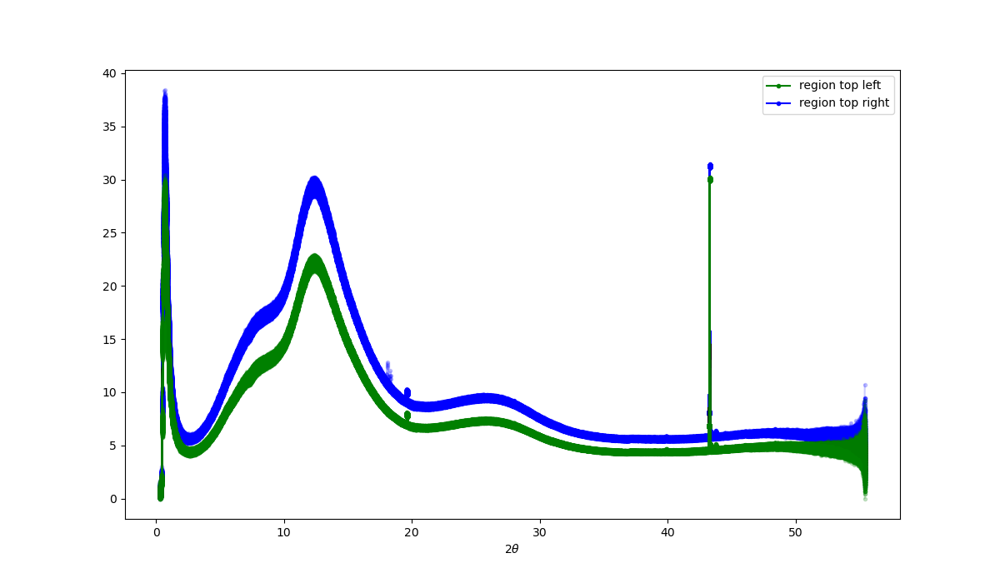

In [14]:
from matplotlib.lines import Line2D 

top_left = intensity[0:15, 0:100]
h, w, d = top_left.shape
top_left = top_left.reshape([h*w, d])

top_right = intensity[0:20, 115:]
h, w, d = top_right.shape
top_right = top_right.reshape([h*w, d])

fig, ax = plt.subplots(figsize=[12, 7])

legend_elements = [Line2D([0], [0], color='g', marker='o',  markersize=3, label='region top left'), 
                   Line2D([0], [0], color='b', marker='o',  markersize=3, label='region top right')]

for b in top_right: 
    ax.plot(x, b, color='b', alpha=0.2, marker='o', markersize=3)
    
for b in top_left:  
    ax.plot(x, b, color='g', alpha=0.2, marker='o', markersize=3)

ax.set_xlabel(r'$2\theta$')
ax.legend(handles=legend_elements)


How to filter out these spikes? Let's plot a single diffractogram and see if and how we can use the `pybaselines` package. 

In [20]:
from pybaselines.morphological import rolling_ball 

In [44]:
y00 = intensity[100, 50]
b00 = base[100, 0]

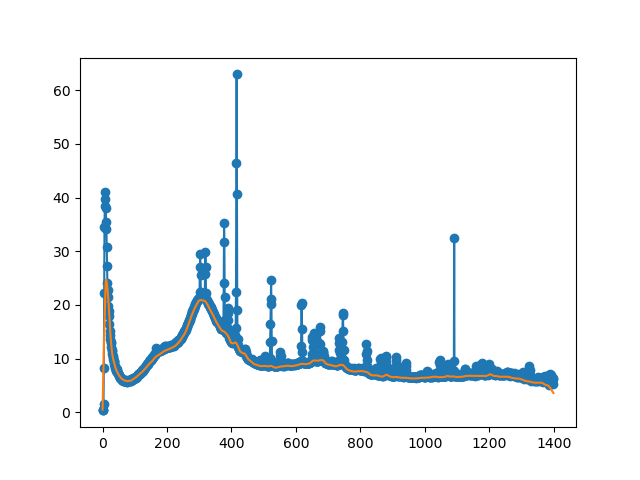

In [45]:
fig, ax = plt.subplots()

ax.plot(y00, marker='o')
ax.plot(b00) 

Let's apply the `rolling_ball()` function on the `intensity` cube and subtract the `baseline_cube` from the `intensity` cube to obtain the baseline corrected `cube`. 

In [69]:
h, w, d = intensity.shape 
baseline_cube = np.zeros_like(intensity) # initialize 

# slow code for now (takes a minute on my machine) 
radius = 5 
for i in range(h): 
    for j in range(w):
        baseline_cube[i, j] = rolling_ball(intensity[i, j], radius)[0]

cube = intensity - baseline_cube 

Next we need to clean up the diffractograms by removing spikes at the extremes plus the 44 degrees spike from the embedding. 

In [70]:
cube[:,:,0:25] = 0 # remove zero angle spike 
cube[:,:, 1380:] = 0 # remove tail noise 
cube[:,:, 1091] = 0 # remove 44 degree spike 

is_negative = cube < 0 # remove negative values 
cube[is_negative] = 0

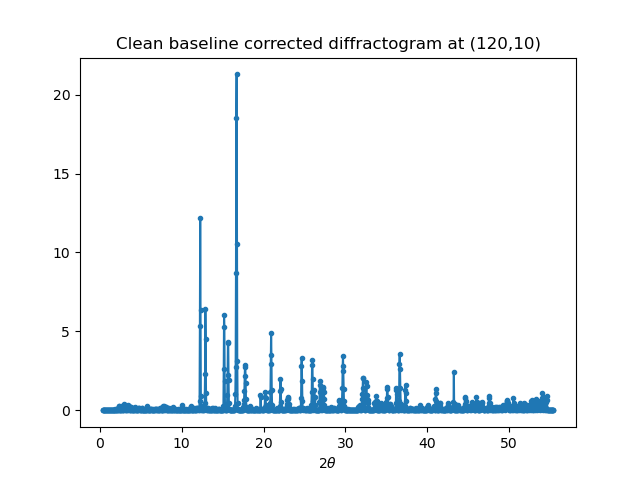

In [74]:
fig, ax = plt.subplots()
i, j  = 120, 10 
ax.plot(x, cube[i, j], marker='o', markersize=3)
ax.set_title(f'Clean baseline corrected diffractogram at ({i},{j})')
ax.set_xlabel(r'$2\theta$');

## Clean cube NMF factorization 

In [76]:
h, w, d = cube.shape
cube_flat = cube.reshape([-1, d])

n_components = 30 

In [77]:
%%time 
H, W, n_iter = skd.non_negative_factorization(cube_flat, n_components=n_components, max_iter=1000)

CPU times: user 19min 25s, sys: 21min 24s, total: 40min 50s
Wall time: 1min 17s


In [78]:
print(f'H.shape: {H.shape}\nW.shape: {W.shape}\nn_iter: {n_iter}')

H.shape: (49600, 30)
W.shape: (30, 1400)
n_iter: 757


In [79]:
H_maps = H.reshape([h, w, n_components])
H_maps = H_maps.transpose(2, 0, 1)

H_pts = np.array([list(np.argwhere(m == m.max()).flatten()) for m in H_maps]) # locate maximum intensity locations in the crystal maps 

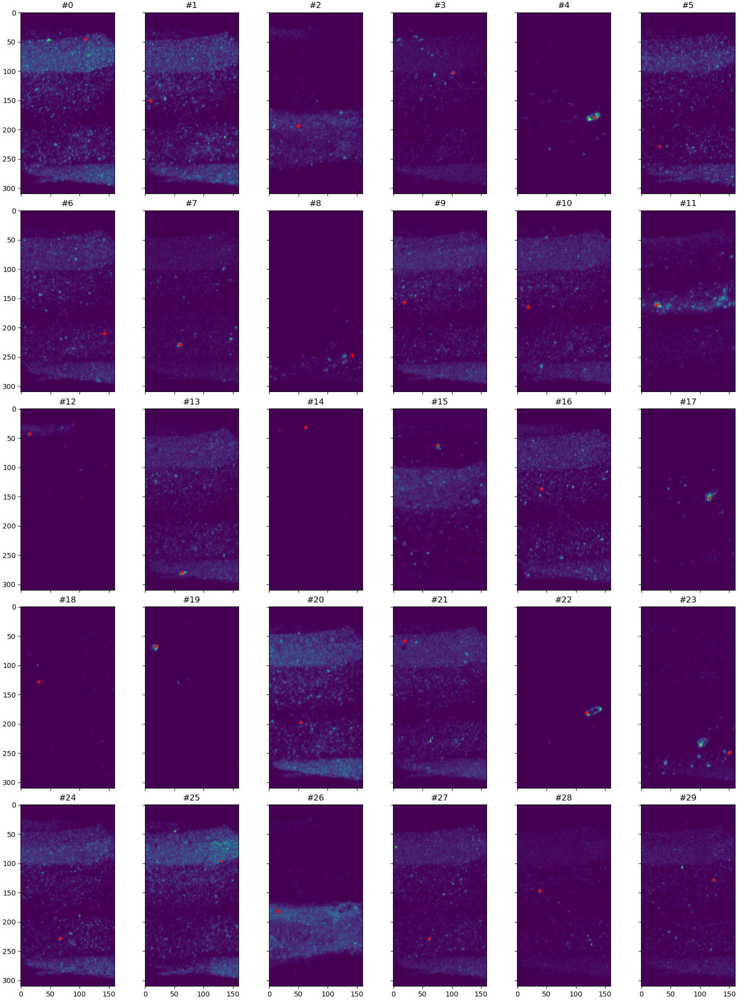

In [85]:
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=[15, 20], sharex=True, sharey=True, layout='constrained')
axs = axs.flatten()

for i, ax in enumerate(axs): 
    #ax.imshow(ske.equalize_hist(H_maps[i]))
    ax.imshow(H_maps[i])#, vmax=0.5*H_maps[i].max())
    ax.set_title(f'#{i}')
    y_i, x_i = H_pts[i]
    ax.scatter(x_i, y_i, color='r', marker='+')

Text(0.5, 0, '$2\\theta$')

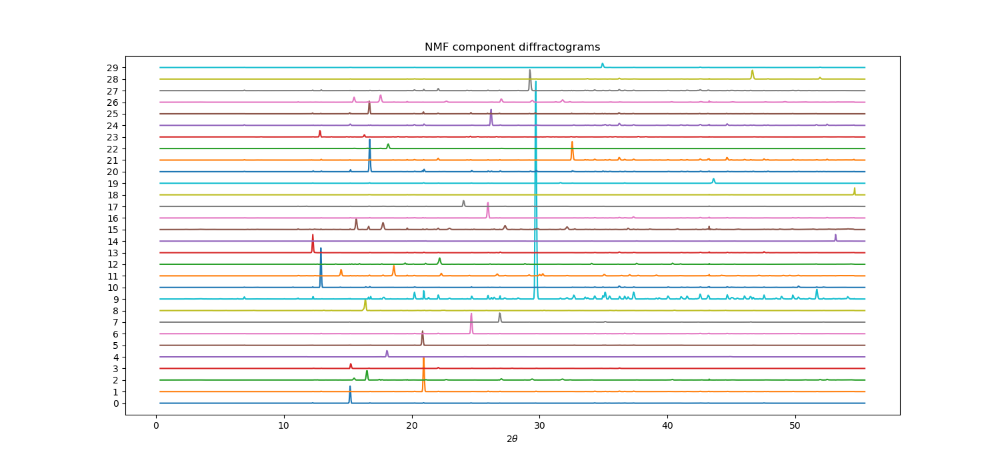

In [83]:
fig, ax = plt.subplots(figsize=[15, 7])

yticks = []
ytick_labels = []
ax.set_ylim(-100, 100*30)
for i, W_i in enumerate(W): 
    yticks.append(100*i)
    ytick_labels.append(i)
    ax.plot(x, 2*W_i+100*i, label=i) 

ax.set_title('NMF component diffractograms')
ax.set_yticks(yticks)
ax.set_yticklabels(ytick_labels)
ax.set_xlabel(r'$2\theta$')

## Regions of interest 

It is problematic that we can not find cadmium sulfide phases in layers 10 and 11 as shown below. Is this due to a problem with the NMF factorization? Therefore we need to compare the complete average diffractograms for rectangular regions directly.  

In [100]:
map_h, map_w = H_maps[0].shape[0:2]

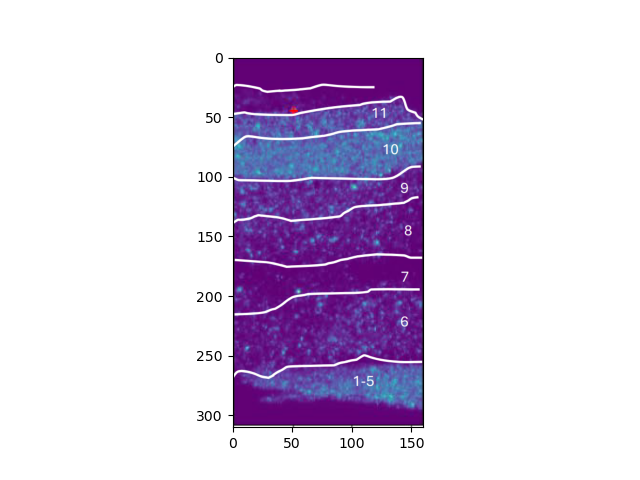

In [137]:
layers = plt.imread('./data/microscopy/1038646-1/numbered-layers-favorite-sample.png')
fig, ax = plt.subplots()
ax.imshow(layers, extent=[0, map_w, map_h, 0])

Zoom and obtain roi indices.

In [159]:
j0, j1 = [int(x) for x in ax.get_xlim()]
i1, i0 = [int(y) for y in ax.get_ylim()]

i0, i1, j0, j1

(48, 59, 60, 95)

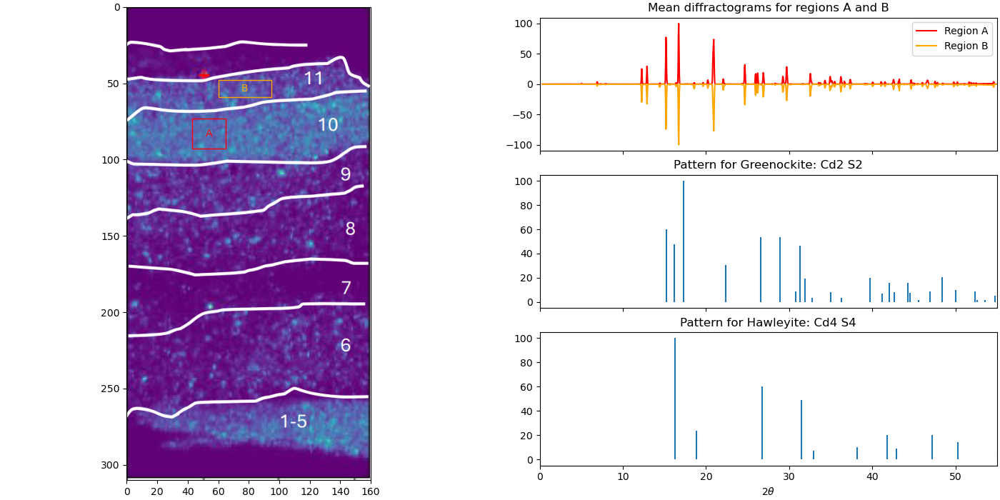

In [174]:
# region A
i0_A, i1_A, j0_A, j1_A = (73, 93, 43, 65)
cube_roi_A = cube[i0_A:i1_A, j0_A:j1_A]
mean_diffractogram_A = cube_roi_A.reshape([-1, 1400]).mean(axis=0)
mean_diffractogram_A = 100 * mean_diffractogram_A / mean_diffractogram_A.max()

# region B
i0_B, i1_B, j0_B, j1_B = (48, 59, 60, 95)
cube_roi_B = cube[i0_B:i1_B, j0_B:j1_B]
mean_diffractogram_B = cube_roi_B.reshape([-1, 1400]).mean(axis=0)
mean_diffractogram_B = 100 * mean_diffractogram_B / mean_diffractogram_B.max()

fig = plt.figure(layout='compressed', figsize=[14, 7])
subfigs = fig.subfigures(1, 2, wspace=0.01)

# left  
ax_im = subfigs[0].subplots() 
ax_im.add_patch(Rectangle([j0_A, i0_A], j1_A - j0_A, i1_A - i0_A, edgecolor='r', facecolor='none'))
ax_im.text(j0_A + (j1_A - j0_A)/2, i0_A + (i1_A - i0_A)/2, 'A', color='r', fontsize=10, ha='center', va='center')

ax_im.add_patch(Rectangle([j0_B, i0_B], j1_B - j0_B, i1_B - i0_B, edgecolor='orange', facecolor='none'))
ax_im.text(j0_B + (j1_B - j0_B)/2, i0_B + (i1_B - i0_B)/2, 'B', color='orange', fontsize=10, ha='center', va='center')

ax_im.imshow(layers, extent=[0, map_w, map_h, 0]) 

# right
axs = subfigs[1].subplots(nrows=3, sharex=True)
ax0, ax1, ax2 = axs.flatten()


n = 24
ax0.set_xlim([0, 55])
ax0.plot(x, mean_diffractogram_A, color='r', label='Region A')
ax0.plot(x, -mean_diffractogram_B, color='orange', label='Region B')
ax0.set_title('Mean diffractograms for regions A and B')

n = 24 #
ax1.set_title(f'Pattern for {df['name'][n]}: {df['formula'][n]}')
ax1.vlines(patterns[n].x, np.zeros_like(patterns[n].y), patterns[n].y)

n = 28 #
ax2.set_title(f'Pattern for {df['name'][n]}: {df['formula'][n]}')
ax2.vlines(patterns[n].x, np.zeros_like(patterns[n].y), patterns[n].y)
ax2.set_xlabel(r'$2\theta$')

ax0.legend()

**It seems that we are forced to conclude that that diffraction data seems to indicate that cadmium sulfide phases Grenockite and Hawleyite are not present in layers 10 and 11.** 

In [173]:
plt.close('all')

Let's explore the discontinuity in our favorite sample a bit further. 

Text(0.5, 1.0, 'discontinuity in IvdW_1038646_1')

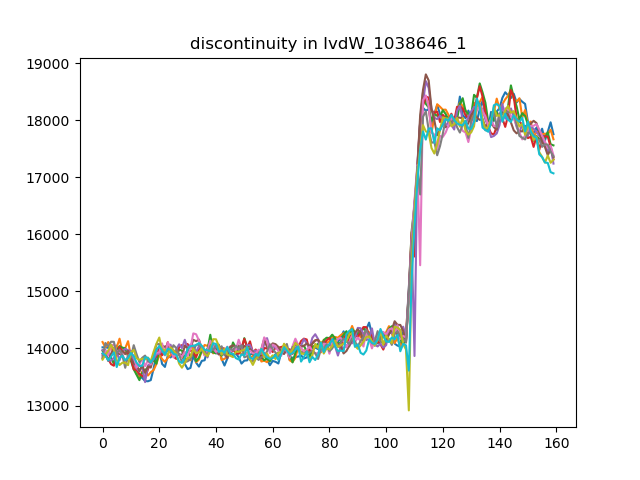

In [321]:
fig, ax = plt.subplots()
for i in range(70, 80):
    ax.plot(sum_map[i])

ax.set_title(f'discontinuity in {favorite}')

Mm, do I need to correct this first? 

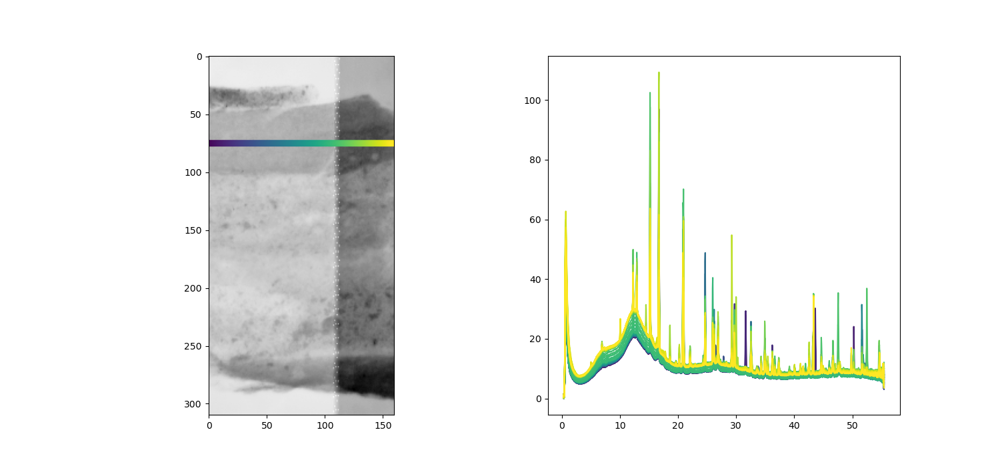

In [331]:
fig, axs = plt.subplots(ncols=2, figsize=[15, 7])

ax1, ax2 = axs.flatten()

h, w = intensity.shape[0:2]
colors = cm.viridis(np.linspace(0, 1, w))

ax1.imshow(sum_map, cmap='Greys')
ax1.scatter(range(w), 75*np.ones(w), color=colors)

for i in range(w): 
    ax2.plot(x, intensity[75, i], color=colors[i])

In [27]:
%matplotlib widget

Ok, let's use my `maxrf4u` homemade rolling ball baseline filter. 

In [418]:
spectrum_left = intensity[75, 100]
baseline = mx.hotmax._baseline(x, spectrum_left, radius=10)

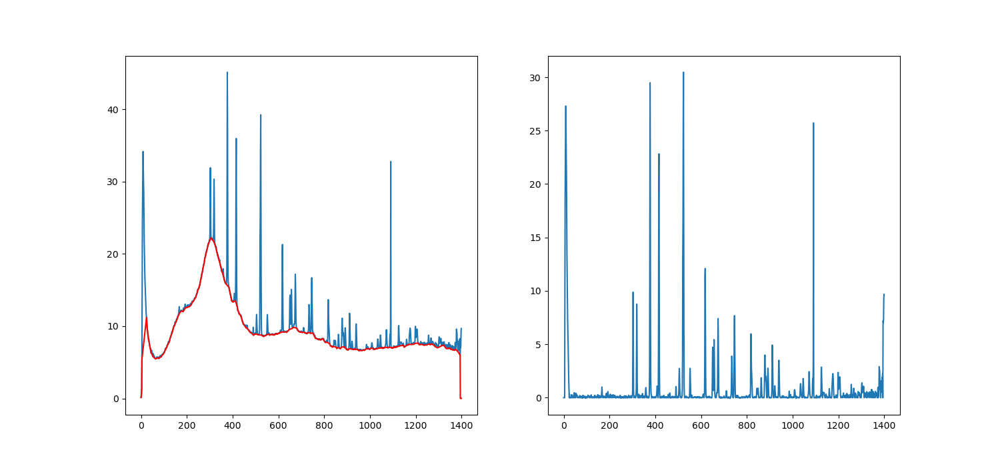

In [424]:
fig, axs = plt.subplots(ncols=2, sharex=True, figsize=[15, 7])
ax1, ax2 = axs.flatten()
ax1.plot(spectrum_left)
ax1.plot(baseline, c='r')
ax2.plot(spectrum_left - baseline)

In [171]:
h, w, d = intensity.shape

intensity_flat = intensity.reshape([h*w, d])
intensity_flat.shape

(49600, 1400)

In [47]:
baselines_flat = [] 

n = len(intensity_flat)

for i, s in enumerate(intensity_flat): 
    print(f'{i}/{n - 1}', end='\r')
    
    baseline = mx.hotmax._baseline(x, s, radius=10)
    baselines_flat.append(baseline)

In [51]:
baselines = np.array(baselines_flat).reshape([h, w, d])

In [48]:
!ls

data  docs  notebooks  viz


In [52]:
with open('data/interim/IvdW_1038646_1_baselines.pkl', 'wb') as fh: 
    pickle.dump(baselines, fh)

## Image registration (front versus back)

Most interesting! It is clear that a single paint layer can contain a large number of crystal phases. With these high contrast images we are now in a better position to register with our microscopy images. Perhaps our best image is the polypol map. So let's export this.  

In [390]:
SVG('data/raw/microscopy/1038646-1/1038646-1_registration.svg')

## Matching with cif data 

Although we downloaded the complete COD database, I am still struggling to create a table or database to search from. For now, let's work with the set of unique crystal structures downloaded from the AMSCD database. See notebook 07. And create an overview of all diffractograms. 

In [86]:
from glob import glob
from pymatgen.core import Structure
from pymatgen.analysis.diffraction.xrd import XRDCalculator
import matplotlib.pyplot as plt 
import numpy as np 
import polars as pl
import os
pl.Config.set_tbl_rows(-1);

In [87]:
unique_cif_files = ['Lanarkite_0010717.cif',
 'Pb3O2(CO3)\r_0014552.cif',
 'Anglesite_0000665.cif',
 'Calcite_0000098.cif',
 'Thenardite_0005113.cif',
 'CadmiumOxalate_2012182.cif',
 'Shannonite_0014550.cif',
 'Glikinite_0020988.cif',
 'Sphalerite_0000110.cif',
 'Vaterite_0004854.cif',
 'CdCl2_0011804.cif',
 'Na2 O3 S\r_0017434.cif',
 'CadmiumChlorideHydrated_2106702.cif',
 'Magnesite_0000099.cif',
 'Sclarite_01317.cif',
 'Hydrocerussite_0009160.cif',
 'Pb3O2(CO3)_0014552.cif',
 'Wurtzite-2H_0010082.cif',
 'Huntite_0001006.cif',
 'cadmiumHydroxyChloride_1010263.cif',
 'Otavite_0000103.cif',
 'Dolomite_0000086.cif',
 'CdCl2\r_0011804.cif',
 'CadmiumHydroxySulphate_2107256.cif',
 'Greenockite_0011540.cif',
 'CadmiumSulphateMonohydrated_2241132.cif',
 'Na2 O4 S\r_0017433.cif',
 'Na2 O3 S_0017434.cif',
 'Hawleyite_0000070.cif',
 'Baryte_0000164.cif',
 'Zincite_0005203.cif',
 'Wurtzite-4H_0005544.cif',
 'Wurtzite-15R_0015414.cif',
 'CadmiumSulphateHydroxyHydrated_1525852.cif',
 'Na2 O4 S_0017433.cif',
 'CadmiumSulphiteHydrated_1541695.cif',
 'CadmiumSulphate_1533737.cif',
 'Wurtzite-10H_0000088.cif',
 'Scotlandite_0015703.cif',
 'Wurtzite_0015179.cif',
 'Zinkosite_0009208.cif',
 'Barite_0000163.cif',
 'Wurtzite-6H_0000115.cif',
 'CadmiumChlorideHydrated25_2106551.cif',
 'Cerussite_0006304.cif',
 'Wurtzite-8H_0000089.cif',
 '(CdSO4)3(H2O)8_1010534.cif',
 'Aragonite_0000233.cif']

Let's try to parse the structures for each unique cif file. 

In [88]:
prefix = 'data/AMCSD-data/amscd-cif-files/'

In [89]:
cif_files = [f'{prefix}{cf}' for cf in unique_cif_files]
len(cif_files)

48

In [90]:
structures = []
formulas = []
cif_nums = []
names = []
for cf in cif_files: 
    #print(f'Parsing: {cf}')
    try: 
        s = Structure.from_file(cf)
        structures.append(s)
        f = s.alphabetical_formula
        formulas.append(f)
        n = os.path.basename(cf)
        cif_nums.append(n)
        names.append(re.split('_', os.path.basename(cf))[0])
    except: 
        print(f'Error parsing: {cf}') 

df = pl.DataFrame({'formula': formulas, 'cif': cif_nums, 'name': names})
df.with_row_index()

/home/frank/.config/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/pymatgen/core/structure.py:3087: UserWarning: Issues encountered while parsing CIF: 2 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/home/frank/.config/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/pymatgen/core/structure.py:3087: UserWarning: Issues encountered while parsing CIF: 5 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/home/frank/.config/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/pymatgen/io/cif.py:1312: UserWarning: Missing elements H from PMG structure composition
  if struct := self._get_structure(data, primitive, symmetrized, check_occu=check_occu):
/home/frank/.config/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/pymatgen/core/structure.py:3087: UserWarn

index,formula,cif,name
u32,str,str,str
0,"""O20 Pb8 S4""","""Lanarkite_0010717.cif""","""Lanarkite"""
1,"""C8 O40 Pb24""","""Pb3O2(CO3) _0014552.cif""","""Pb3O2(CO3) """
2,"""O16 Pb4 S4""","""Anglesite_0000665.cif""","""Anglesite"""
3,"""C6 Ca6 O18""","""Calcite_0000098.cif""","""Calcite"""
4,"""Na16 O32 S8""","""Thenardite_0005113.cif""","""Thenardite"""
5,"""C4 Cd2 O8""","""CadmiumOxalate_2012182.cif""","""CadmiumOxalate"""
6,"""C4 O16 Pb8""","""Shannonite_0014550.cif""","""Shannonite"""
7,"""O18 S4 Zn6""","""Glikinite_0020988.cif""","""Glikinite"""
8,"""S4 Zn4""","""Sphalerite_0000110.cif""","""Sphalerite"""


In [91]:
n_structures = len(structures)
n_structures

48

In [93]:
synchrotron_wavelength = 9.510908054342373e-1 # as reported in json AND CONVERTED TO Angstroms!!! 
#alpha = 1.025
alpha = 1
patterns = [XRDCalculator(wavelength=synchrotron_wavelength * alpha).get_pattern(s) for s in structures]

In [94]:
W.shape

(30, 1400)

Text(0.5, 1.0, 'Hawleyite')

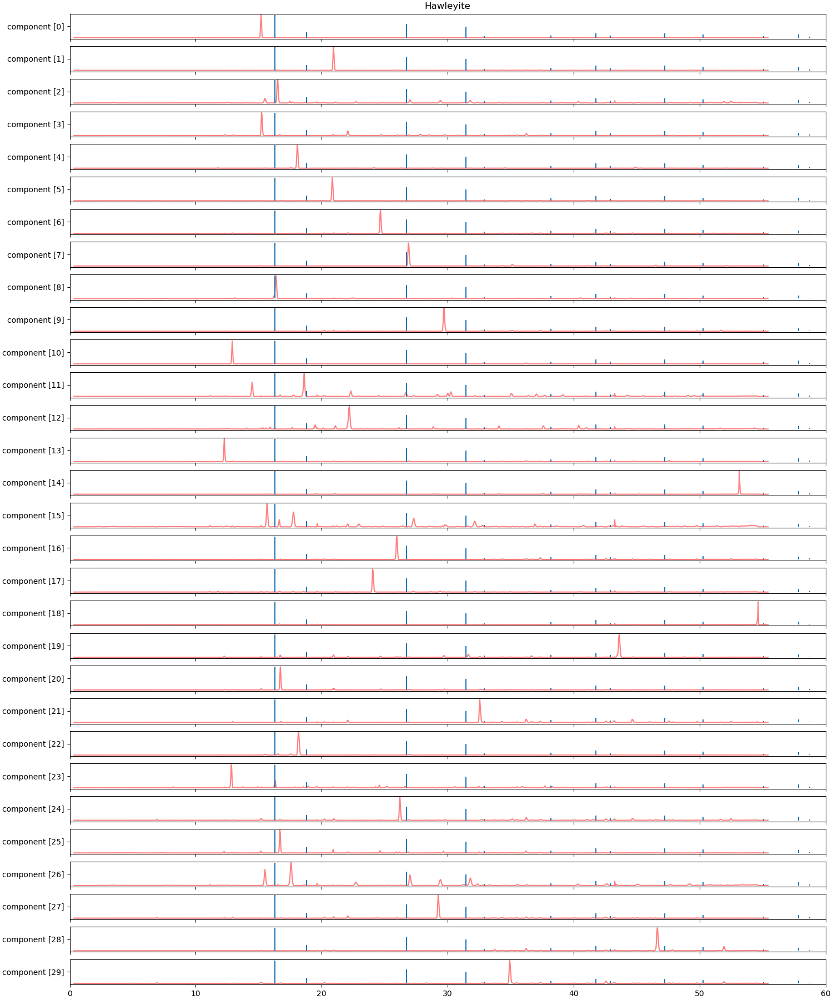

In [96]:
n = 28

n_components = len(W)

fig, axs = plt.subplots(nrows=n_components, figsize=[15, 18], layout='constrained', sharex=True)

axs = axs.flatten()

for i, [ax, w] in enumerate(zip(axs, W)):

    ax.plot(x, 100* w / max(w), color='r', alpha=0.5)
    ax.vlines(patterns[n].x, np.zeros_like(patterns[n].y), patterns[n].y)
    ax.set_xlim(0, 60)
    ax.set_yticks([50])
    ax.set_yticklabels([f'component [{i}]'])

axs[0].set_title(names[n])

Comparison with AMCDS diffraction data:

Conclusion so far is that NMF components `[5]` and `[19]` correspond with Cd2S2 Greenockite, with certain unknown concentrations of Zn.  

## Exporting as xy file (works, but EVA does not understand)

Here is an example of an `.xy` file with anode copper. 

In [38]:
xy_file = glob('**/*.xy', recursive=True)[0]
xy_file

'data/interim/component-xy-files/component_00.xy'

In [59]:
with open(xy_file, 'r') as fh: 
    lines = fh.readlines()

In [63]:
lines[0:10]

['\'Id: "" Comment: "1375_blackpowder_loc2. Vital" Operator: "Luc Megens" Anode: "CU" Scantype: "Detector Scan" TimePerStep: "120" \n',
 '17.7000 0.000\n',
 '17.8000 0.010\n',
 '17.9000 0.006\n',
 '18.0000 -0.003\n',
 '18.1000 0.004\n',
 '18.2000 0.009\n',
 '18.3000 0.001\n',
 '18.4000 0.008\n',
 '18.5000 -0.003\n']

In [54]:
from scipy.interpolate import interp1d

def two_theta_shift(ptrn_x, ptrn_y, old_wavelength, new_wavelength, verbose=True): 
    '''Shift `x` two theta pattern angles (in degrees) from `old_wavelength` to `new_wavelength` (in Angstroms). 
    
    Mask invalid angles that would be shifted beyond 180 degrees.'''

    ratio = new_wavelength / old_wavelength
    z = ratio * np.sin(np.deg2rad(ptrn_x) / 2)
    is_valid = z < 1
                
    new_x = 2 * np.rad2deg(np.arcsin(z[is_valid]))
    new_y = ptrn_y[is_valid]

    if verbose: 
        n_invalid = np.sum(~is_valid)
        print(f'Discarding {n_invalid} angles.')

    return new_x, new_y


def interpolate(x, y): 

    f = interp1d(x, y)
    x_lin = np.arange(1, 55, 0.1)
    y_lin = f(x_lin)

    return x_lin, y_lin

def write_xy_file(x, y, filename, comment='\'Id: "?" Comment: "?" Operator: "?" Anode: "CU" Scantype: "?" TimePerStep: "120" \n'):

    with open(filename, 'w') as fh: 
        fh.write(comment)

        for xi, yi in zip(x, y): 
            line = f'{xi:.03f} {yi:.04f}\n'
            fh.write(line)
               

In [41]:
component_filenames = [f'./data/interim/component-xy-files/component_{i:02d}.xy' for i in range(len(W))]
component_filenames

['./data/interim/component-xy-files/component_00.xy',
 './data/interim/component-xy-files/component_01.xy',
 './data/interim/component-xy-files/component_02.xy',
 './data/interim/component-xy-files/component_03.xy',
 './data/interim/component-xy-files/component_04.xy',
 './data/interim/component-xy-files/component_05.xy',
 './data/interim/component-xy-files/component_06.xy',
 './data/interim/component-xy-files/component_07.xy',
 './data/interim/component-xy-files/component_08.xy',
 './data/interim/component-xy-files/component_09.xy',
 './data/interim/component-xy-files/component_10.xy',
 './data/interim/component-xy-files/component_11.xy',
 './data/interim/component-xy-files/component_12.xy',
 './data/interim/component-xy-files/component_13.xy',
 './data/interim/component-xy-files/component_14.xy',
 './data/interim/component-xy-files/component_15.xy',
 './data/interim/component-xy-files/component_16.xy',
 './data/interim/component-xy-files/component_17.xy',
 './data/interim/component-x

In [208]:
W.shape

(30, 1400)

In [46]:
synchrotron_wavelength = 0.9510908054342373 
Cu_wavelength = 1.540884610730401 # Angstroms 

In [47]:
n = 0
y = W[n]
new_x, new_y = two_theta_shift(x, y, synchrotron_wavelength, Cu_wavelength)

Discarding 0 angles.


Text(0.5, 1.0, 'Component [0] shifted to wavelength: 1.541 Angstrom')

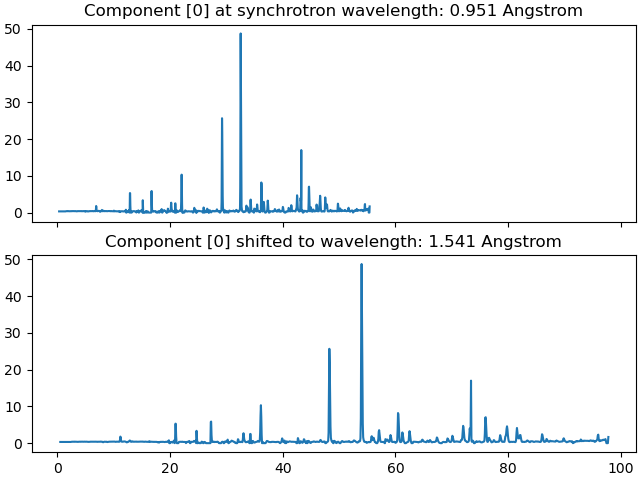

In [48]:
fig, axs = plt.subplots(nrows=2, sharex=True, layout='compressed')

ax0, ax1 = axs.flatten()

ax0.plot(x, y)
ax0.set_title(f'Component [{n}] at synchrotron wavelength: {synchrotron_wavelength:.3f} Angstrom')
ax1.plot(new_x, new_y)
ax1.set_title(f'Component [{n}] shifted to wavelength: {Cu_wavelength:.3f} Angstrom')


In [55]:
for i, w in enumerate(W): 

    y = w / w.max()

    new_x, new_y = two_theta_shift(x, y, synchrotron_wavelength, Cu_wavelength)
    lin_x, lin_y = interpolate(new_x, new_y)
    
    write_xy_file(lin_x, lin_y, filename=component_filenames[i])

Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.
Discarding 0 angles.


In [95]:
from scipy.interpolate import interp1d

In [109]:
w = W[0]
y = w / w.max()
x_lin, y_lin = interpolate(x, y)

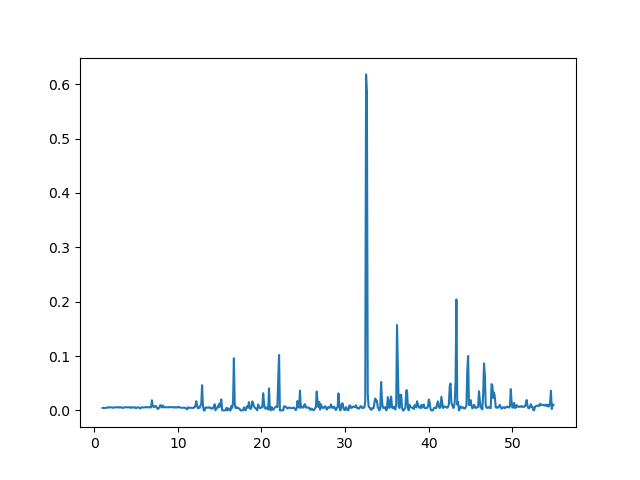

In [111]:
fig, ax = plt.subplots()
ax.plot(x_lin, y_lin)

## Converting synchrotron wavelength to copper 

The Bragg condition should make it fairly simple to convert the measured diffraction pattern to another wavelength. Afterwards we can check this with the `XRDCalculator`.

Here is the Bragg condition, which holds for the synchrotron wavelength $\lambda_{s}$ and the synchrotron angle $\theta_{s}$.

$$ n \lambda_{s} = 2 d \sin \theta_{s} \tag{1} $$

This condition, with the same lattice distance $d$ also holds for the Cu Ka wavelength $\lambda_{cu}$ and Cu Ka angle $\theta_{cu}$

Combining these two equations and eliminating d should allow is the express $\theta_{cu}$ as a function of $\theta_{s}$...

$$ \theta_{cu} = \arcsin (\frac{\lambda_{cu}}{\lambda_{s}} \sin(\theta_{s})) $$

Expressed as two theta we get: 

$$ 2 \theta_{cu} = 2 \arcsin(\frac{\lambda_{cu}}{\lambda_s} \sin(\theta_{s})) $$

In [120]:
np.pi

3.141592653589793

In [122]:
theta_rad = np.pi * x / 360
theta_rad

array([0.00294085, 0.00328446, 0.00362806, ..., 0.48295748, 0.48330109,
       0.48364469])

In [126]:
Cu = xraydb.xray_lines('Cu')

In [142]:
Cu_wavelength =  1e10 * Planck * light_speed / (Cu['Ka1'].energy * electron_charge) # Angstroms

In [148]:
Cu_wavelength = 1.540884610730401 # Angstroms 

In [144]:
syn_wavelength = 9.510908054342373e-1 # as reported in json AND CONVERTED TO Angstroms!!! 

In [155]:
Cu_two_theta = 180 * ((2 * np.arcsin((Cu_wavelength / syn_wavelength) * np.sin(theta_rad))) / np.pi)

In [156]:
Cu_two_theta

array([ 0.54597749,  0.60976917,  0.67356097, ..., 97.5949819 ,
       97.6807755 , 97.76662714])

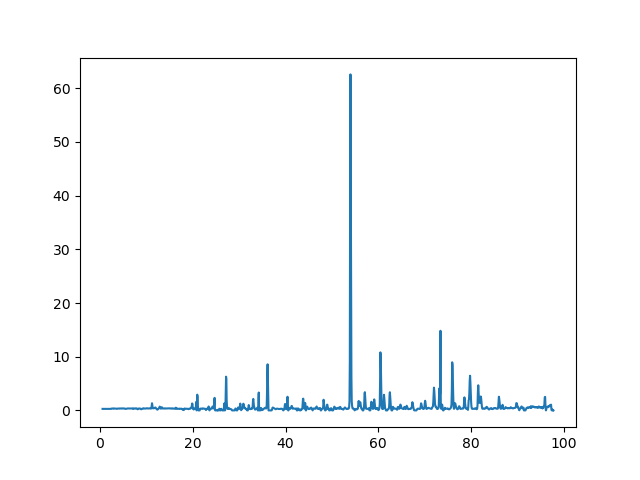

In [157]:
fig, ax = plt.subplots()

ax.plot(Cu_two_theta, W[0])

In [158]:
cif_files

['data/AMCSD-data/amscd-cif-files/Lanarkite_0010717.cif',
 'data/AMCSD-data/amscd-cif-files/Pb3O2(CO3)\r_0014552.cif',
 'data/AMCSD-data/amscd-cif-files/Anglesite_0000665.cif',
 'data/AMCSD-data/amscd-cif-files/Calcite_0000098.cif',
 'data/AMCSD-data/amscd-cif-files/Thenardite_0005113.cif',
 'data/AMCSD-data/amscd-cif-files/CadmiumOxalate_2012182.cif',
 'data/AMCSD-data/amscd-cif-files/Shannonite_0014550.cif',
 'data/AMCSD-data/amscd-cif-files/Glikinite_0020988.cif',
 'data/AMCSD-data/amscd-cif-files/Sphalerite_0000110.cif',
 'data/AMCSD-data/amscd-cif-files/Vaterite_0004854.cif',
 'data/AMCSD-data/amscd-cif-files/CdCl2_0011804.cif',
 'data/AMCSD-data/amscd-cif-files/Na2 O3 S\r_0017434.cif',
 'data/AMCSD-data/amscd-cif-files/CadmiumChlorideHydrated_2106702.cif',
 'data/AMCSD-data/amscd-cif-files/Magnesite_0000099.cif',
 'data/AMCSD-data/amscd-cif-files/Sclarite_01317.cif',
 'data/AMCSD-data/amscd-cif-files/Hydrocerussite_0009160.cif',
 'data/AMCSD-data/amscd-cif-files/Pb3O2(CO3)_001455

In [ ]:
s = Structure.from_file('data/AMCSD-data/amscd-cif-files/Greenockite_0011540.cif')

synchrotron_wavelength = 9.510908054342373e-1 # as reported in json AND CONVERTED TO Angstroms!!! 
synchrotron_pattern = XRDCalculator(wavelength=synchrotron_wavelength).get_pattern(s)

Cu_wavelength = 1.540884610730401 # Angstroms 
Cu_pattern = XRDCalculator(wavelength=Cu_wavelength).get_pattern(s)

new_x, new_y = two_theta_shift(synchrotron_pattern.x, synchrotron_pattern.y, synchrotron_wavelength, Cu_wavelength)

Text(0.5, 1.0, 'Wavelength shifted Greenockite')

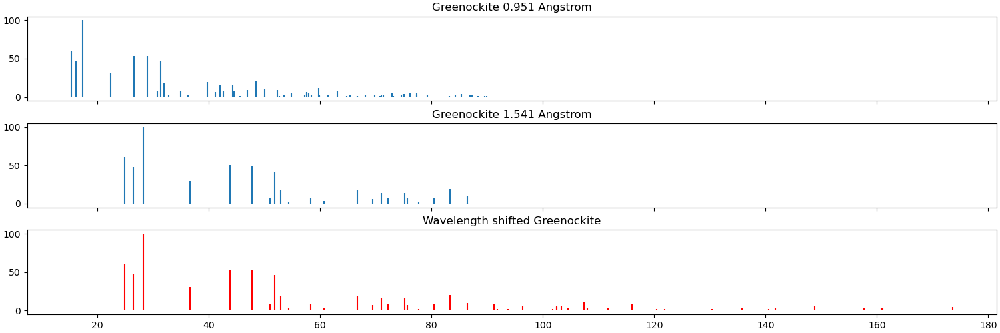

In [234]:
fig, axs = plt.subplots(nrows=3, sharex=True, figsize=[15, 5], layout='compressed')
ax0, ax1, ax2 = axs.flatten()
ax0.vlines(synchrotron_pattern.x, np.zeros_like(synchrotron_pattern.y), synchrotron_pattern.y)
ax0.set_title(f'Greenockite {synchrotron_wavelength:0.3f} Angstrom')


ax1.vlines(Cu_pattern.x, np.zeros_like(Cu_pattern.y), Cu_pattern.y)
ax1.set_title(f'Greenockite {Cu_wavelength:0.3f} Angstrom')


ax2.vlines(new_x, np.zeros_like(new_y), new_y, color='r')
ax2.set_title('Wavelength shifted Greenockite')

In [194]:
def two_theta_shift(x, y, old_wavelength, new_wavelength): 
    '''Shift `x` two theta pattern angles (in degrees) from `old_wavelength` to `new_wavelength` (in Angstroms). 
    
    Mask invalid angles that would be shifted beyond 180 degrees.'''

    ratio = new_wavelength / old_wavelength

    z = ratio * np.sin(np.deg2rad(twotheta) / 2)

    is_valid = z < 1
                

    new_x = 2 * np.rad2deg(np.arcsin(z[is_valid]))
    new_y = y[is_valid]

    return new_x, new_y

In [195]:
new_x, new_y = two_theta_shift(synchrotron_pattern.x, synchrotron_pattern.y, synchrotron_wavelength, Cu_wavelength)